<a href="https://colab.research.google.com/github/Nikhil-Bajaj/Cloud-Project/blob/main/MusicRecommendationSpotify.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

from collections import defaultdict
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib
number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']



In [ ]:
!pip install spotipy
SPOTIFY_CLIENT_ID = "Enter Client ID here"
SPOTIFY_CLIENT_SECRET = "Enter Secret Here"

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id= SPOTIFY_CLIENT_ID,
                                                           client_secret=SPOTIFY_CLIENT_SECRET))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd drive/MyDrive/Datasets


/content/drive/MyDrive/Datasets


In [ ]:
def read_data():
  read_data.data = pd.read_csv("data/data.csv")
  read_data.genre_data = pd.read_csv('data/data_by_genres.csv')
  read_data.year_data = pd.read_csv('data/data_by_year.csv')
  print("Data Read Successfully")

In [ ]:
read_data()

Data Read Successfully


In [ ]:
read_data.year_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB


In [ ]:
print(read_data.data.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
print(read_data.genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [ ]:
print(read_data.year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade


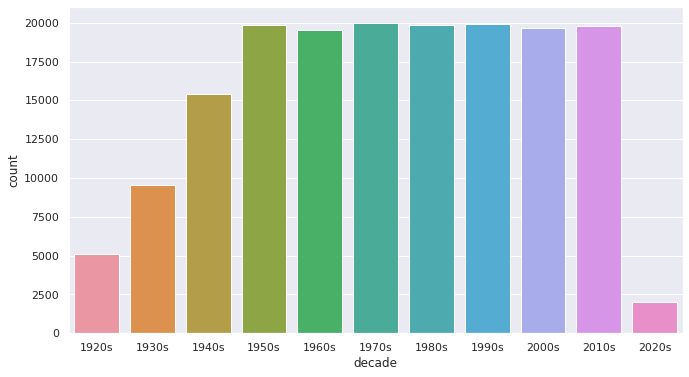

In [ ]:

read_data.data['decade'] = read_data.data['year'].apply(get_decade)

sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(read_data.data['decade'])

In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(read_data.year_data, x='year', y=sound_features)
fig.show()

In [ ]:
top10_genres = read_data.genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

Clustering Genres with K-Means

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt

In [ ]:
def knn_genre():
  cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
  X = read_data.genre_data.select_dtypes(np.number)
  cluster_pipeline.fit(X)
  read_data.genre_data['cluster'] = cluster_pipeline.predict(X)
  print("Clusters generated successfully")
  return X

Just Visualization

In [ ]:
def knn_visualise(X):
  tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
  genre_embedding = tsne_pipeline.fit_transform(X)
  projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
  projection['genres'] = read_data.genre_data['genres']
  projection['cluster'] = read_data.genre_data['cluster']
  fig = px.scatter(
      projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
  fig.show()

Clustering Songs with K-Means

In [ ]:
def knn_songs():
  knn_songs.song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                    ('kmeans', KMeans(n_clusters=20,
                                    verbose=False))
                                  ], verbose=False)

  X = read_data.data.select_dtypes(np.number)
  number_cols = list(X.columns)
  knn_songs.song_cluster_pipeline.fit(X)
  song_cluster_labels = knn_songs.song_cluster_pipeline.predict(X)
  read_data.data['cluster_label'] = song_cluster_labels
  return X

Visualization

In [ ]:
# Visualizing the Clusters with PCA

def knn_visualise1(X):

  pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
  song_embedding = pca_pipeline.fit_transform(X)
  projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
  projection['title'] = read_data.data['name']
  projection['cluster'] = read_data.data['cluster_label']
  fig = px.scatter(
      projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
  fig.show()

Recommender System

Config Credentials

In [ ]:
def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

In [ ]:
def get_song_data(song, spotify_data):
    song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]

    return song_data


def get_mean_vector(song_list, spotify_data):
    song_vectors = []
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)
    scaler = knn_songs.song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
def main():
  read_data()
  x =knn_genre()
  knn_visualise(x)
  y =knn_songs()
  knn_visualise1(y)
  print(recommend_songs([{'name': 'Come As You Are', 'year':1991},
                {'name': 'Smells Like Teen Spirit', 'year': 1991},
                {'name': 'Lithium', 'year': 1992},
                {'name': 'All Apologies', 'year': 1993}],  read_data.data))


In [ ]:
main()

Data Read Successfully
Clusters generated successfully
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.004s...
[t-SNE] Computed neighbors for 2973 samples in 0.324s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.112427
[t-SNE] KL divergence after 1000 iterations: 1.388063


[{'name': 'Hanging By A Moment', 'year': 2000, 'artists': "['Lifehouse']"}, {'name': 'Kiss Me', 'year': 1997, 'artists': "['Sixpence None The Richer']"}, {'name': "Breakfast At Tiffany's", 'year': 1995, 'artists': "['Deep Blue Something']"}, {'name': 'Otherside', 'year': 1999, 'artists': "['Red Hot Chili Peppers']"}, {'name': "It's Not Living (If It's Not With You)", 'year': 2018, 'artists': "['The 1975']"}, {'name': 'No Excuses', 'year': 1994, 'artists': "['Alice In Chains']"}, {'name': 'Wherever You Will Go', 'year': 2001, 'artists': "['The Calling']"}, {'name': 'Ballbreaker', 'year': 1995, 'artists': "['AC/DC']"}, {'name': 'Runaway (U & I)', 'year': 2015, 'artists': "['Galantis']"}, {'name': "Club Can't Handle Me (feat. David Guetta)", 'year': 2010, 'artists': "['Flo Rida', 'David Guetta']"}]


In [ ]:
from datetime import datetime
import pytz

tz_Germany = pytz.timezone('Europe/Berlin')
now = datetime.now(tz_Germany)
#now.fromtimestamp("%Y-%M-%D")

current_time = now.strftime('"%Y-%m-%d %H:%M:%S"')
print("Current Time =", current_time)

Current Time = "2022-07-03 12:04:56"


"2022-07-03 12:04:56"


In [ ]:
import time
stime= time.time()
time.sleep(2)
etime=time.time()
Duration= etime-stime
Duration=("{:.2f}".format(Duration))
print(Duration)

2.00
